In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

In [4]:
!git clone https://github.com/zhouhaoyi/ETDataset/
!pip install pytorch_lightning

Cloning into 'ETDataset'...
remote: Enumerating objects: 187, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 187 (delta 25), reused 20 (delta 20), pack-reused 159
Receiving objects: 100% (187/187), 3.86 MiB | 17.86 MiB/s, done.
Resolving deltas: 100% (62/62), done.
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using c

## Exploratory Data Analysis

In [ ]:
data1 = pd.read_csv("/content/ETDataset/ETT-small/ETTh1.csv")
data1['date'] = pd.to_datetime(data1['date'])
data1.head()

,date,HUFL,HULL,MUFL,MULL,LUFL,LULL,OT
0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000
1,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001
2,2016-07-01 02:00:00,5.157,1.741,1.279,0.355,3.777,1.218,27.787001
3,2016-07-01 03:00:00,5.090,1.942,1.279,0.391,3.807,1.279,25.044001
4,2016-07-01 04:00:00,5.358,1.942,1.492,0.462,3.868,1.279,21.948000


Features:
- **HUFL**: **H**igh **U**se**F**ul **L**oad
- **HULL**: **H**igh **U**se**L**ess **L**oad
- **MUFL**: **M**iddle **U**se**F**ul **L**oad
- **MULL**: **M**iddle **U**se**L**ess **L**oad
- **LUFL**: **L**ow **U**se**F**ul **L**oad
- **LULL**: **L**ow **U**se**L**ess **L**oad

Target:
- **OT**: **O**il **T**emperature

In [ ]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17420 entries, 0 to 17419
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    17420 non-null  datetime64[ns]
 1   HUFL    17420 non-null  float64       
 2   HULL    17420 non-null  float64       
 3   MUFL    17420 non-null  float64       
 4   MULL    17420 non-null  float64       
 5   LUFL    17420 non-null  float64       
 6   LULL    17420 non-null  float64       
 7   OT      17420 non-null  float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 1.1 MB


In [ ]:
data1.describe().T

,count,mean,min,25%,50%,75%,max,std
date,17420,2017-06-28 21:30:00,2016-07-01 00:00:00,2016-12-29 10:45:00,2017-06-28 21:30:00,2017-12-27 08:15:00,2018-06-26 19:00:00,NaN
HUFL,17420.0,7.375141,-22.705999,5.827,8.774,11.788,23.643999,7.067744
HULL,17420.0,2.242242,-4.756,0.737,2.21,3.684,10.114,2.042342
MUFL,17420.0,4.300239,-25.087999,3.296,5.97,8.635,17.341,6.826978
MULL,17420.0,0.881568,-5.934,-0.284,0.959,2.203,7.747,1.809293
LUFL,17420.0,3.066062,-1.188,2.315,2.833,3.625,8.498,1.164506
LULL,17420.0,0.856932,-1.371,0.67,0.975,1.218,3.046,0.599552
OT,17420.0,13.324672,-4.08,6.964,11.396,18.079,46.007,8.566946


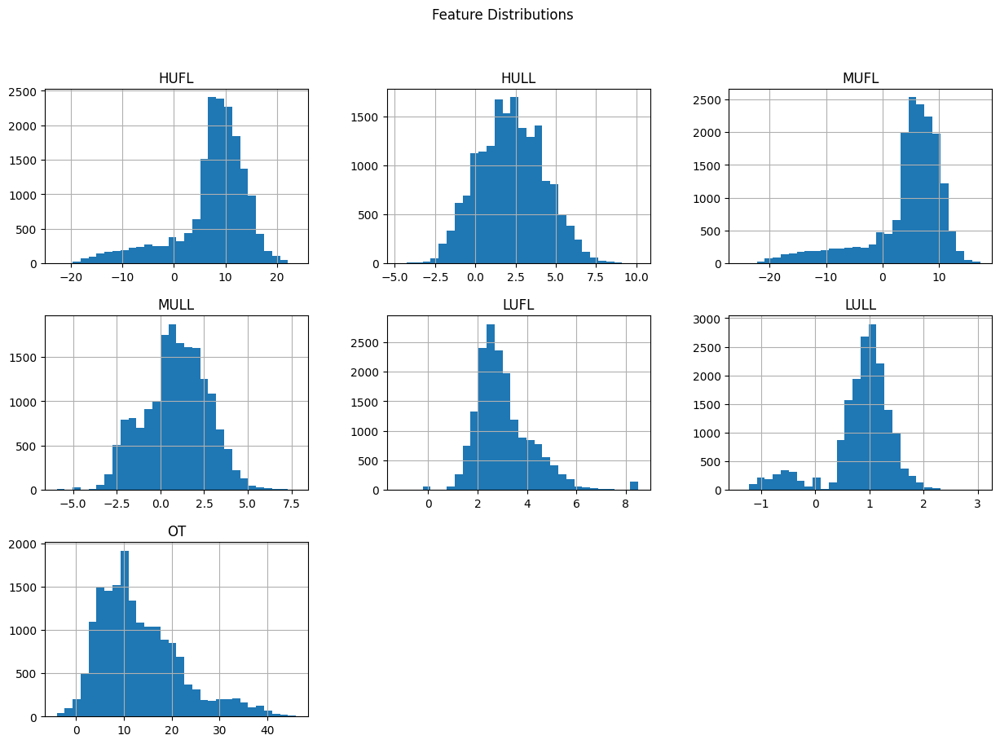

In [ ]:
data1[['HUFL', 'HULL', 'MUFL', 'MULL', 'LUFL', 'LULL', 'OT']].hist(bins=30, figsize=(15, 10))
plt.suptitle('Feature Distributions')
plt.show()

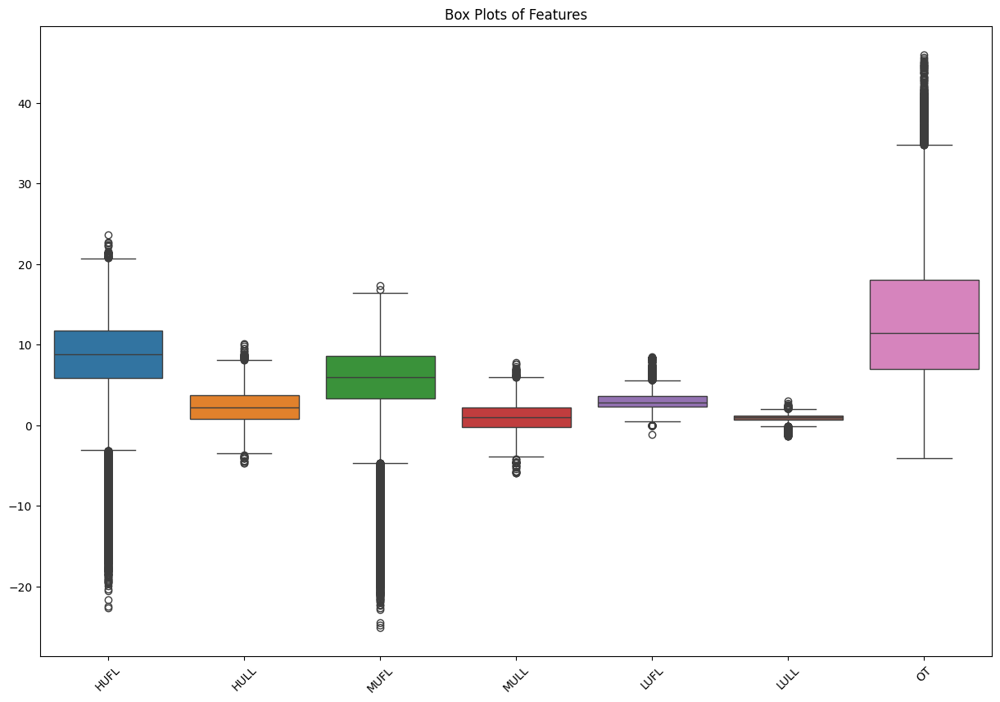

In [ ]:
plt.figure(figsize=(15, 10))
sns.boxplot(data=data1[['HUFL', 'HULL', 'MUFL', 'MULL', 'LUFL', 'LULL', 'OT']])
plt.title('Box Plots of Features')
plt.xticks(rotation=45)
plt.show()

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
data = data1.copy(deep=True)
data.set_index('date', inplace=True)

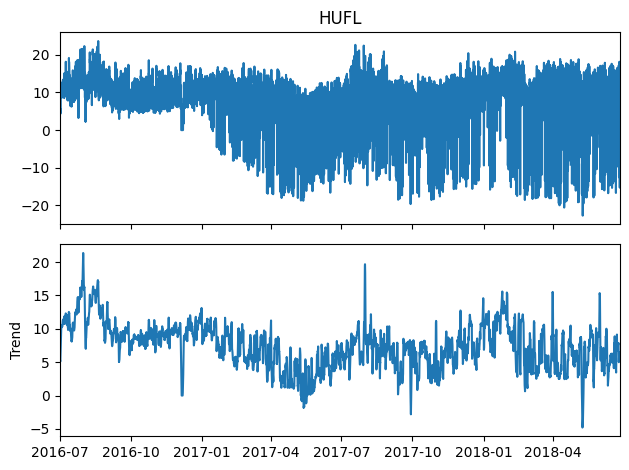

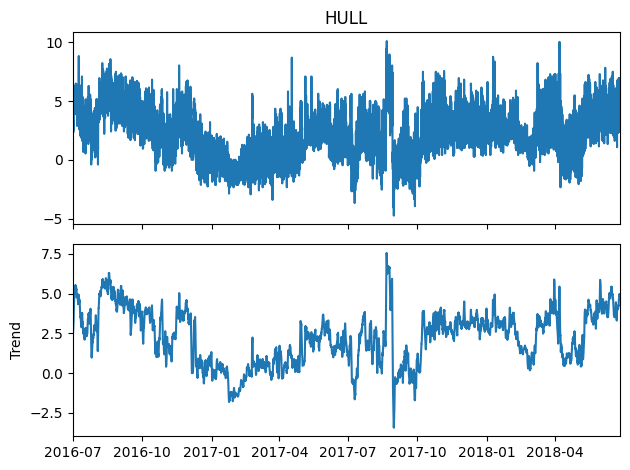

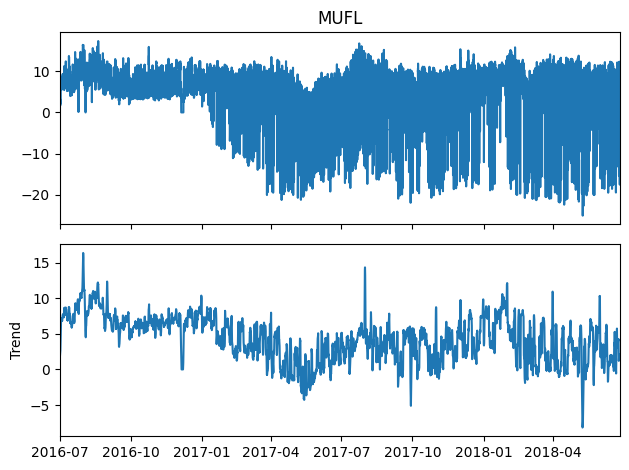

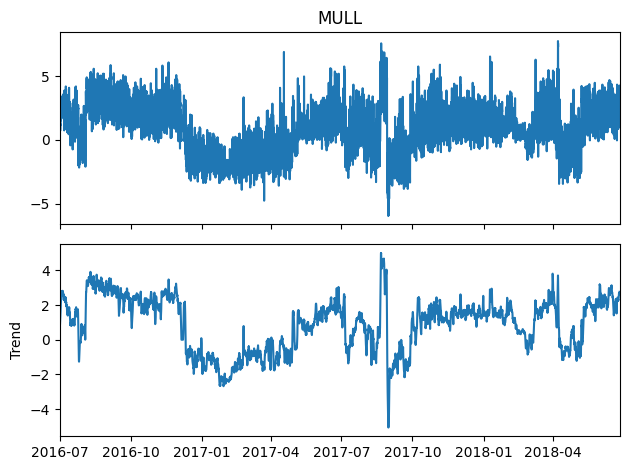

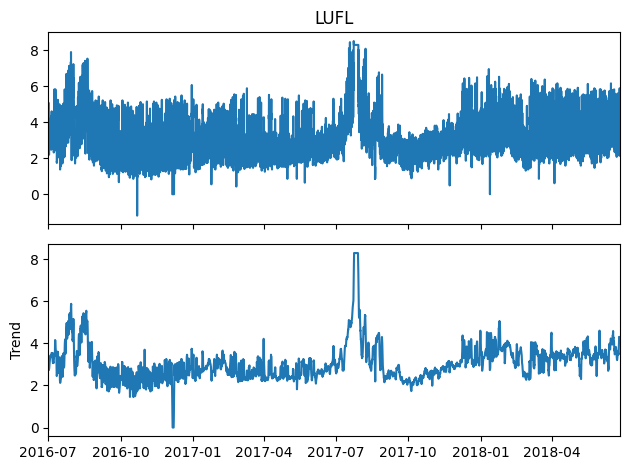

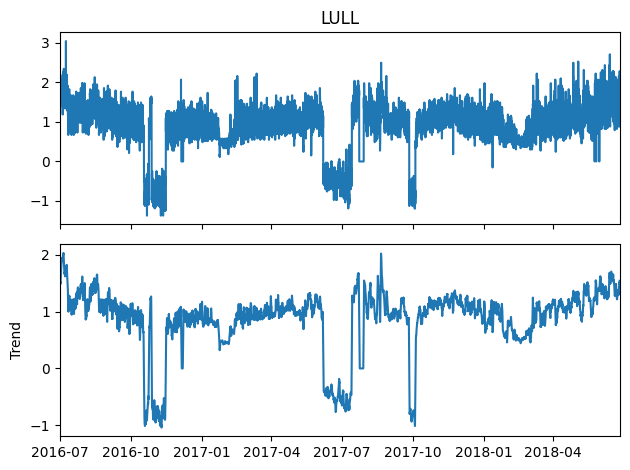

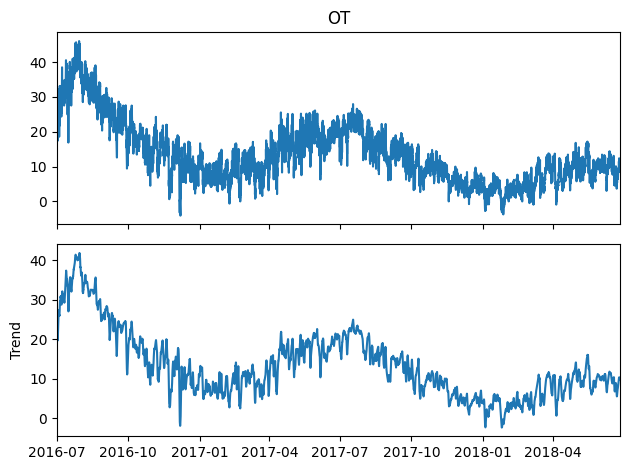

In [ ]:
for column in data.columns:
    result = seasonal_decompose(data[column], model='additive')
    result.plot(seasonal=False, resid=False)
plt.show()

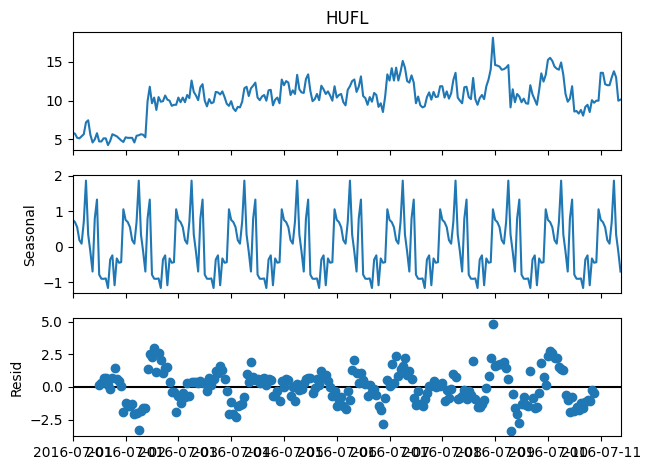

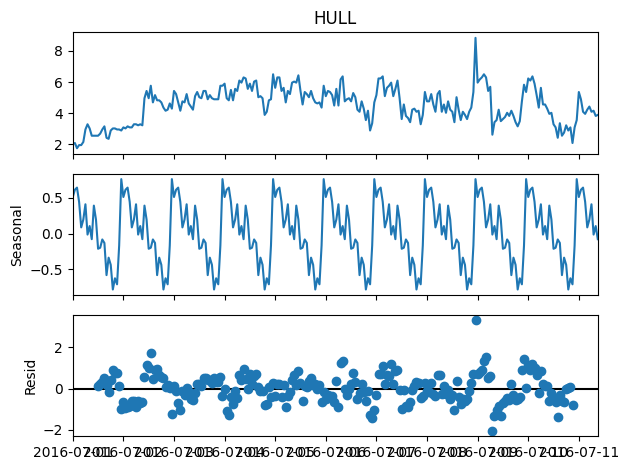

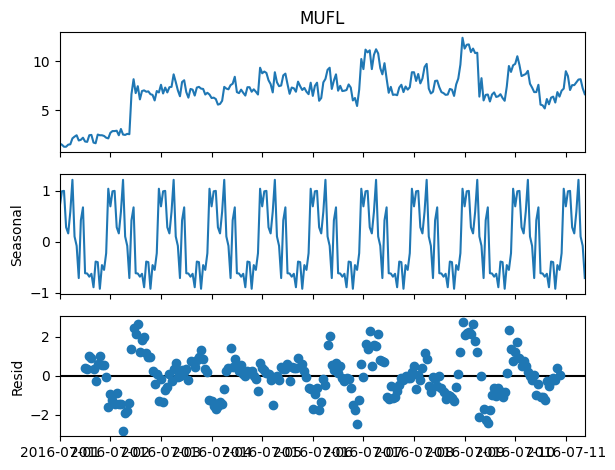

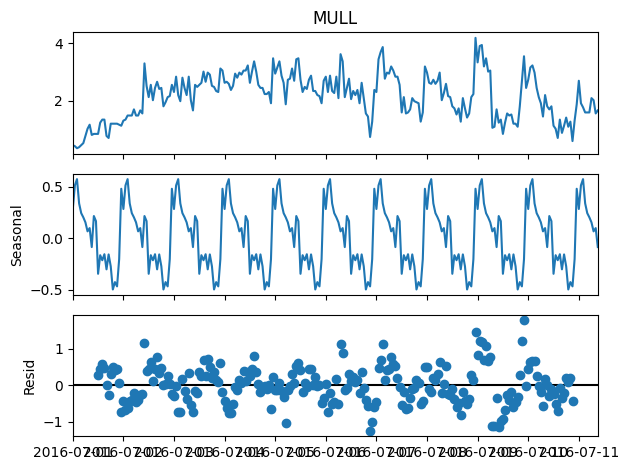

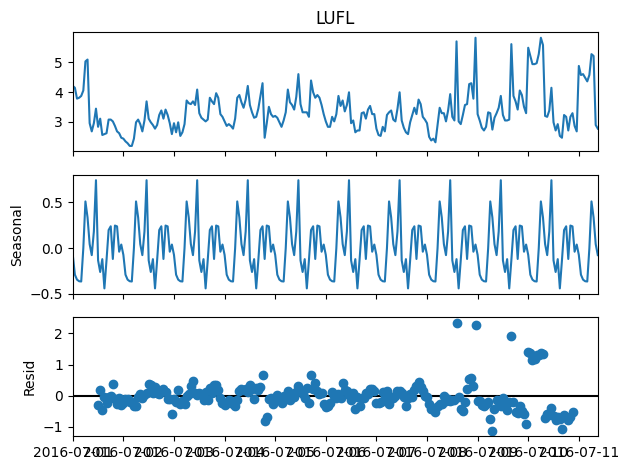

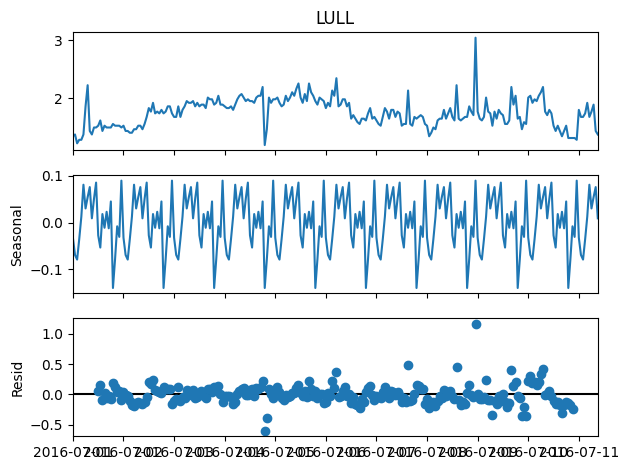

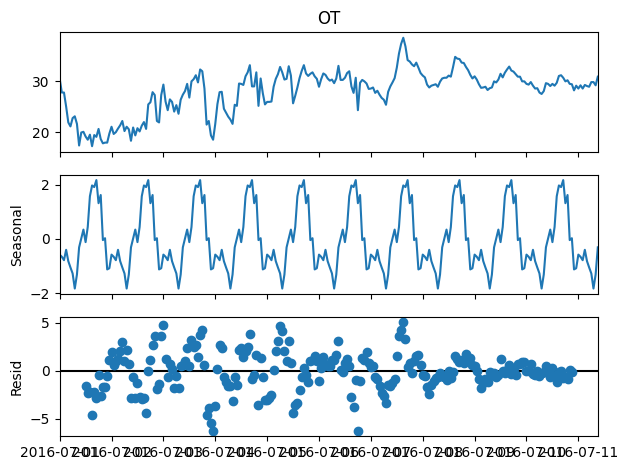

In [ ]:
for column in data.columns:
    result = seasonal_decompose(data[column][:250], model='additive')
    result.plot(trend=False)
    plt.show()

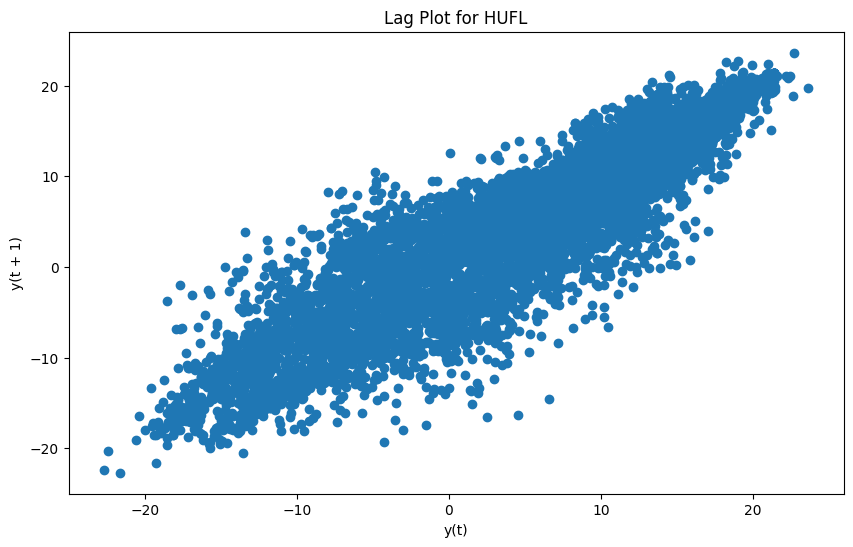

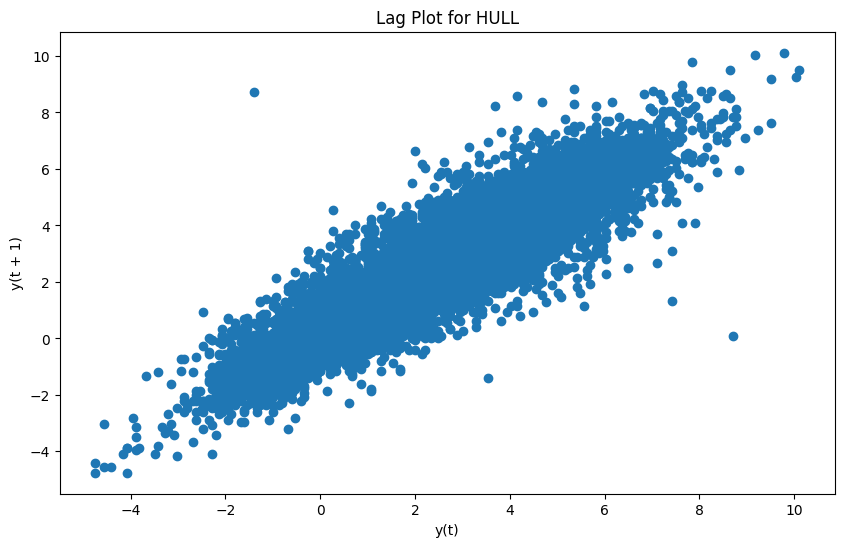

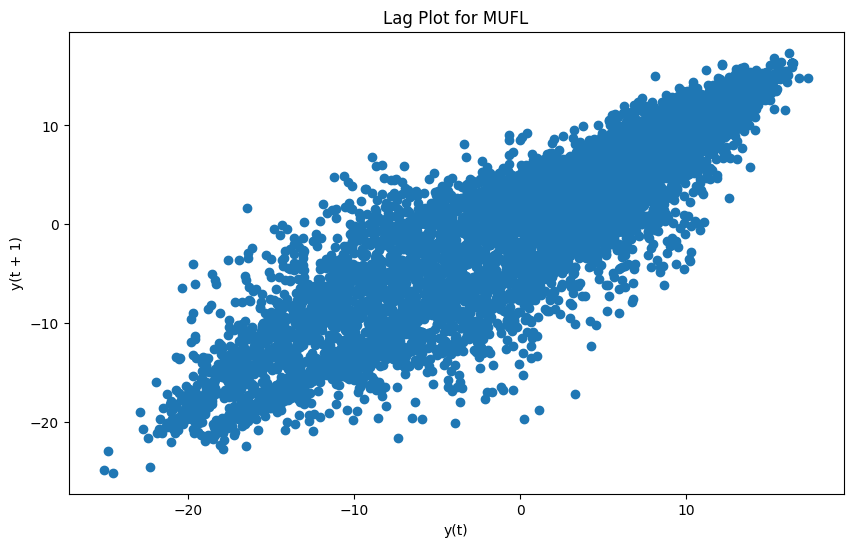

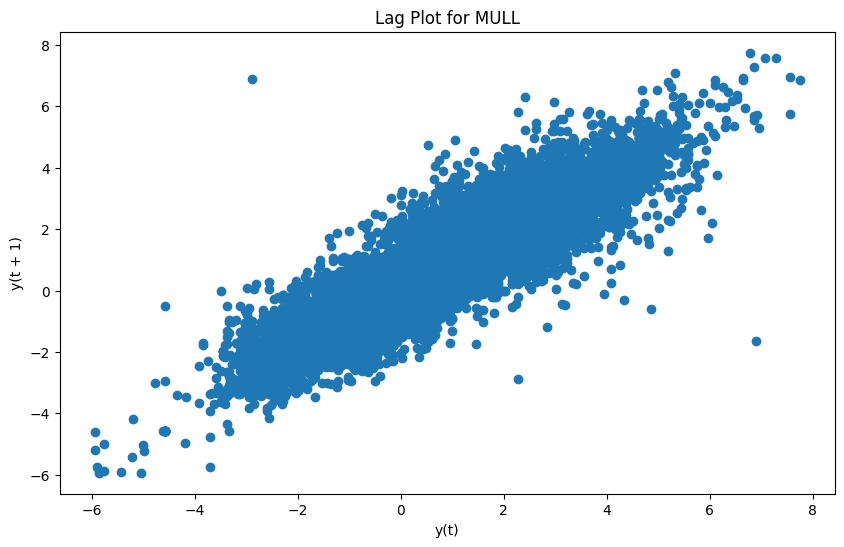

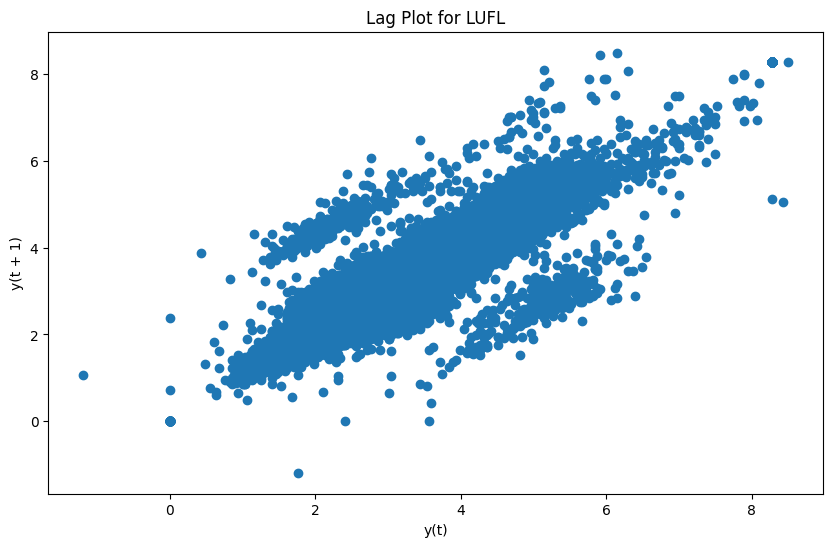

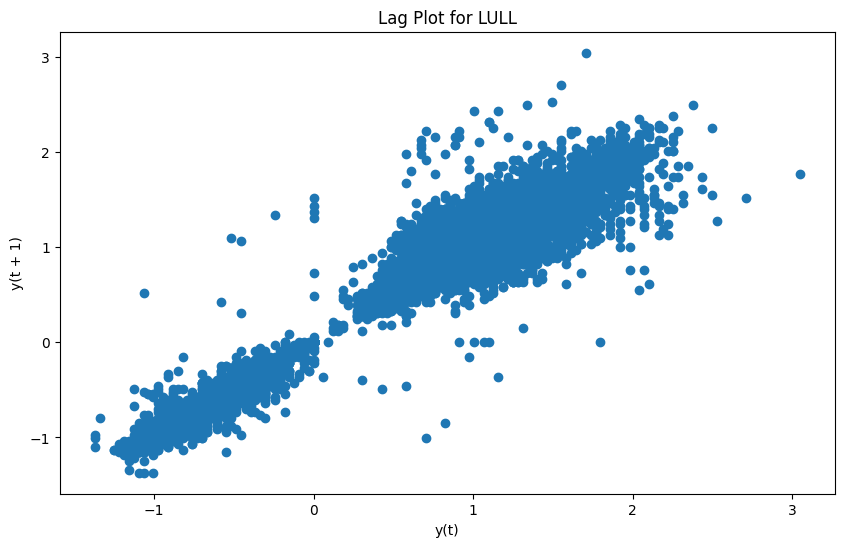

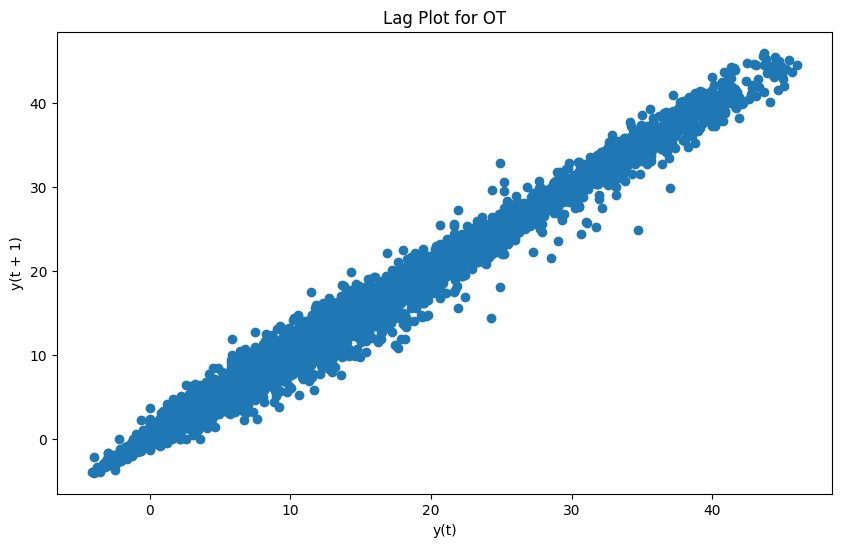

In [ ]:
for column in data.columns:
    plt.figure(figsize=(10, 6))
    pd.plotting.lag_plot(data[column])
    plt.title(f'Lag Plot for {column}')
    plt.show()


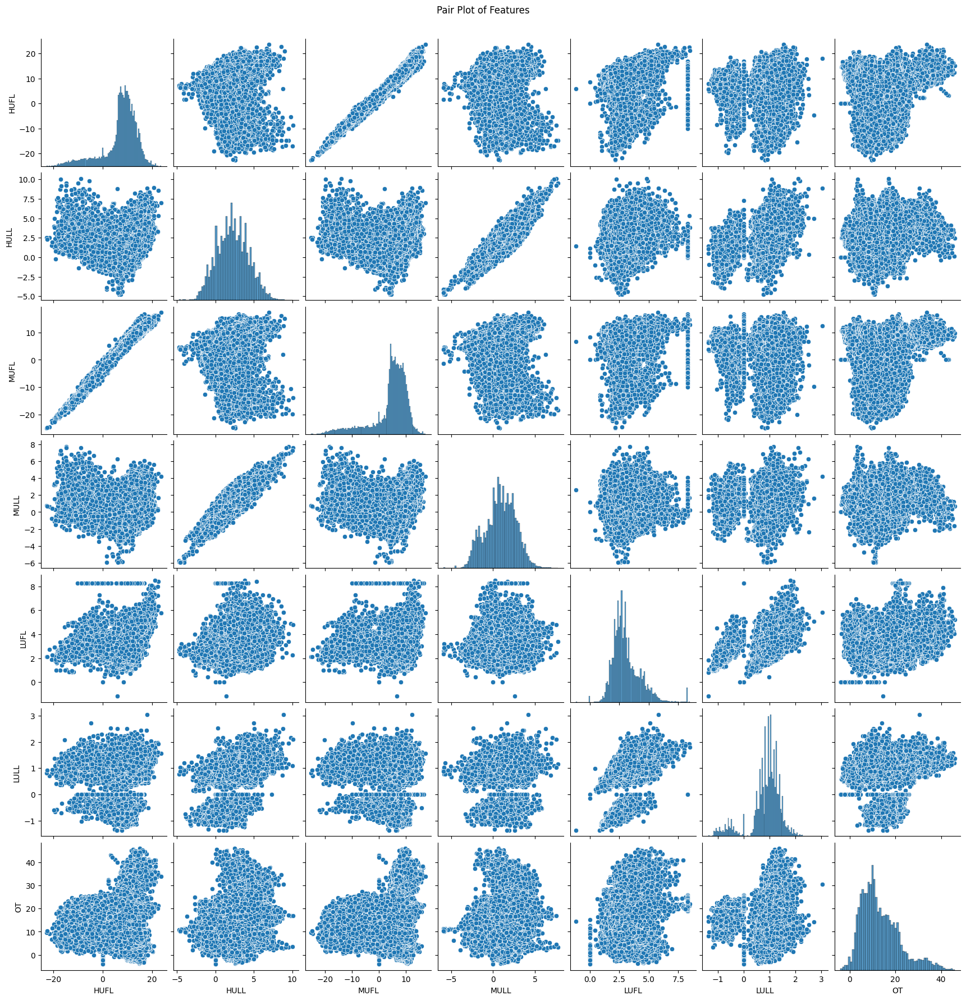

In [ ]:
sns.pairplot(data[data.columns])
plt.suptitle('Pair Plot of Features', y=1.02)
plt.show()

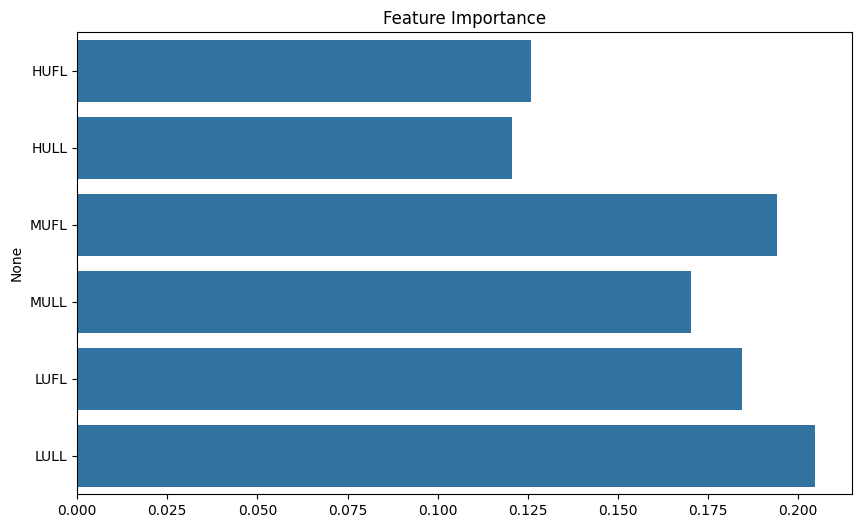

In [ ]:
from sklearn.ensemble import RandomForestRegressor

X = data[list(data.columns)[:-1]]
y = data['OT']

model = RandomForestRegressor()
model.fit(X, y)

importances = model.feature_importances_
plt.figure(figsize=(10, 6))
sns.barplot(y=X.columns, x=importances)
plt.title('Feature Importance')
plt.show()


In [ ]:
import plotly as py
import plotly.io as pio
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

In [ ]:
data1_scaled = scaler.fit_transform(X=data1.drop(['date', 'OT'], axis=1), y=data1['OT'])

In [ ]:
data1.head()

,date,HUFL,HULL,MUFL,MULL,LUFL,LULL,OT
0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000
1,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001
2,2016-07-01 02:00:00,5.157,1.741,1.279,0.355,3.777,1.218,27.787001
3,2016-07-01 03:00:00,5.090,1.942,1.279,0.391,3.807,1.279,25.044001
4,2016-07-01 04:00:00,5.358,1.942,1.492,0.462,3.868,1.279,21.948000


In [ ]:
data1_scaled = pd.DataFrame(data1_scaled, index=data1.index, columns=['HUFL', 'HULL', 'MUFL', 'MULL', 'LUFL', 'LULL'])

In [ ]:
data1_scaled['date'] = data1['date']
data1_scaled['OT'] = data1['OT']

In [ ]:
fig = go.Figure()

for column in ['HUFL', 'HULL', 'MUFL', 'MULL', 'LUFL', 'LULL']:
    fig.add_scatter(x=data1_scaled['date'], y=data1_scaled[column], name=column, showlegend=True)

fig.update_xaxes(rangeslider_visible=True, rangeselector=dict(
    buttons=list([
            dict(count=7, label="1w", step="day", stepmode="backward"),
            dict(count=14, label="2w", step="day", stepmode="backward"),
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=3, label="3m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

fig.show()
# График интерактивный, можно выбирать периоды (ползунок снизу или кнопки сверху) и линии (клик по линии в легенде отключает ее, двойной клик изолирует)

In [ ]:
fig = go.Figure(data=px.line(data1, x='date', y='OT'))

fig.update_xaxes(rangeslider_visible=True, rangeselector=dict(
    buttons=list([
            dict(count=7, label="1w", step="day", stepmode="backward"),
            dict(count=14, label="2w", step="day", stepmode="backward"),
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=3, label="3m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

fig.show()

# Tests

In [ ]:
from transformer_gan import TransformerGAN


gen = TransformerGAN(
    target_columns=df.columns,
    conditional_columns=df2.columns,
    embedding_dim=7,
    window_size=10,
    num_disc_steps=1,
    batch_size=16,
    num_epochs=1,
    lr=0.001,
    verbose=True,
)
gen.fit(train_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type                     | Params | Mode 
----------------------------------------------------------
0 | gen  | TransformerGenerator     | 8.4 K  | train
1 | disc | TransformerDiscriminator | 7.5 K  | train
----------------------------------------------------------
15.9 K    Trainable params
0         Non-trainable params
15.9 K    Total params
0.064     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=1` reached.


In [ ]:
gen_1_head = TransformerGAN(
    target_columns=df.columns,
    conditional_columns=df2.columns,
    embedding_dim=7,
    window_size=10,
    num_disc_steps=1,
    batch_size=16,
    num_epochs=1,
    num_heads_discriminator=1,
    num_heads_generator=1,
    lr=0.001,
    verbose=True,
)
gen_1_head.fit(train_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type                     | Params | Mode 
----------------------------------------------------------
0 | gen  | TransformerGenerator     | 8.4 K  | train
1 | disc | TransformerDiscriminator | 7.5 K  | train
----------------------------------------------------------
15.9 K    Trainable params
0         Non-trainable params
15.9 K    Total params
0.064     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=1` reached.


In [ ]:
fakes = gen.sample(test_data, n_samples=1)
fake_data = fakes[0]
fake_data.head()

,HUFL,HULL,MUFL,MULL,LUFL,LULL,OT,dayofweek_cos,dayofweek_sin,day_cos,day_sin,month_cos,month_sin
0,-3.205176,0.804861,0.684434,-1.942399,-6.868690,-6.050340,0.053588,-0.433884,0.992709,-0.900969,0.980785,-0.195090,0.120537
1,1.188119,-0.936329,-1.224349,-0.278227,-3.472006,-1.581413,0.105909,-0.974928,0.992709,-0.222521,0.923880,-0.382683,0.120537
2,0.768661,-2.786861,-2.495197,0.334859,-3.036942,-0.922193,-1.462328,-0.974928,0.992709,-0.222521,0.923880,-0.382683,0.120537
3,-3.444323,-2.395733,-1.366615,1.964586,-1.703118,-2.328340,-1.819514,-0.974928,0.992709,-0.222521,0.923880,-0.382683,0.120537
4,-2.016033,-0.799959,-1.038541,-0.879542,-0.950699,0.191512,-0.528111,-0.974928,0.992709,-0.222521,0.923880,-0.382683,0.120537


In [ ]:
test_data.shape

(2613, 13)

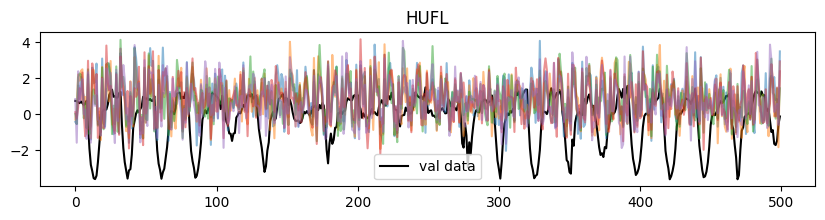

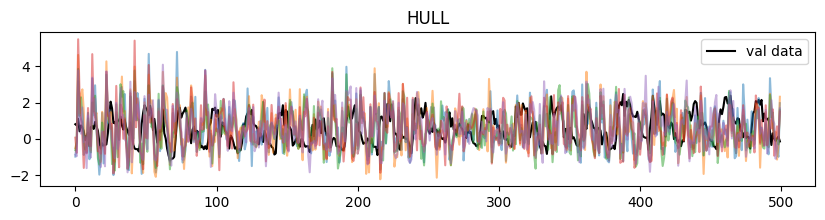

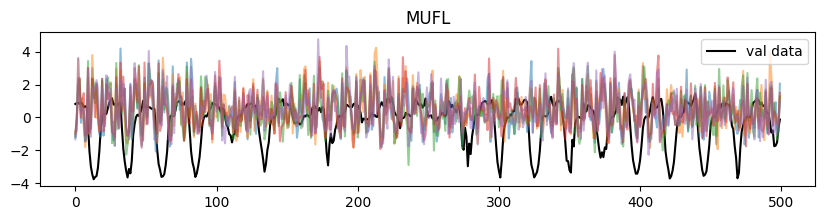

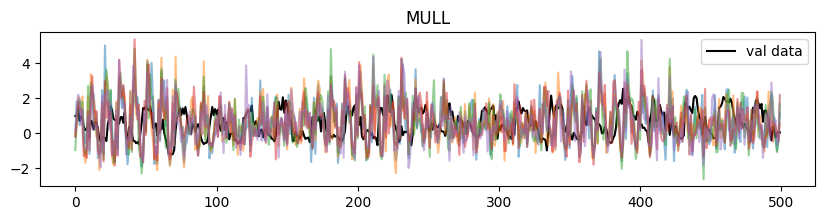

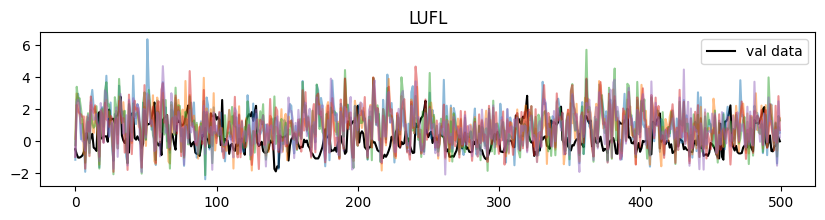

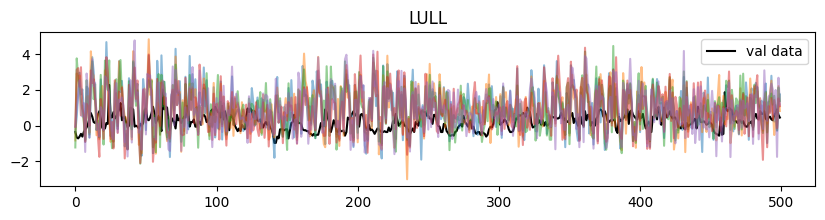

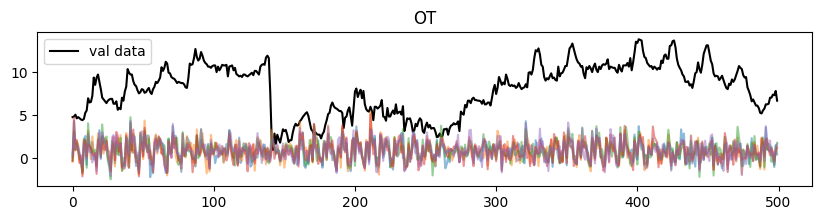

In [ ]:
fakes = gen.sample(test_data, n_samples=5)
for col in df.columns:
    plt.figure(figsize=(10, 2))
    plt.plot(test_data[col].values[:500], label='val data', c='black')
    for fake_data in fakes:
        plt.plot(fake_data[col].values[:500], alpha=0.5)
    plt.legend()
    plt.title(col)
    plt.show()

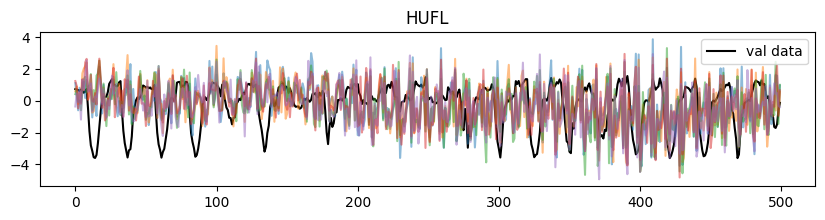

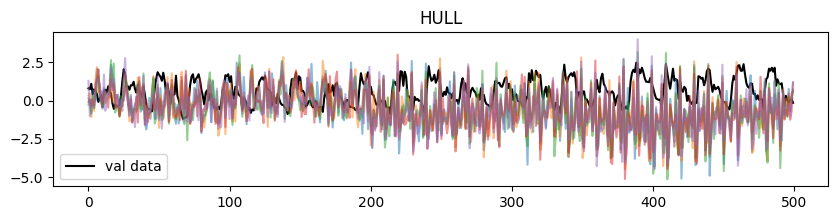

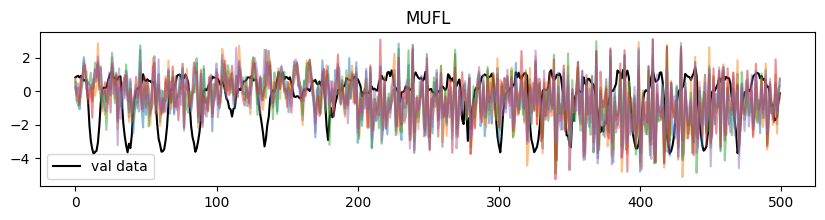

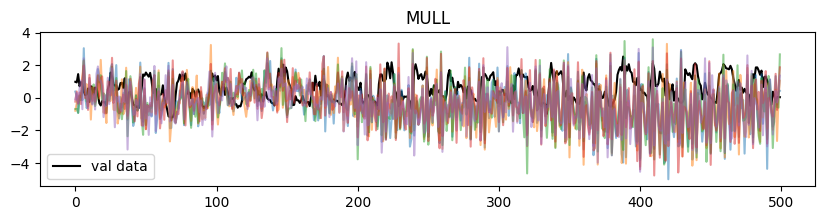

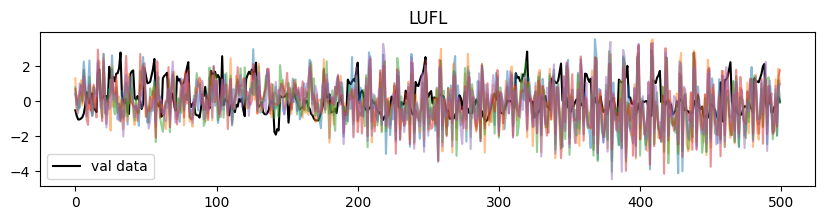

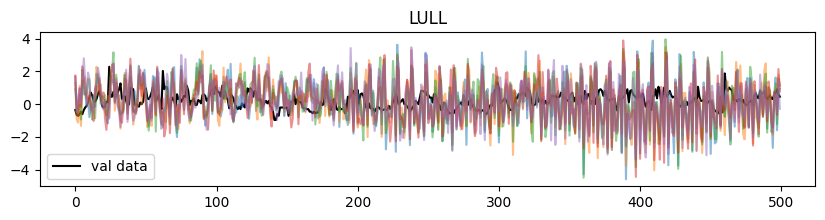

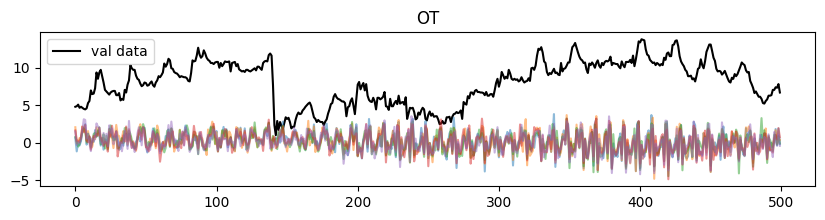

In [ ]:
fakes = gen_1_head.sample(test_data, n_samples=5)
for col in df.columns:
    plt.figure(figsize=(10, 2))
    plt.plot(test_data[col].values[:500], label='val data', c='black')
    for fake_data in fakes:
        plt.plot(fake_data[col].values[:500], alpha=0.5)
    plt.legend()
    plt.title(col)
    plt.show()

In [ ]:
gen_2 = TransformerGAN(
    target_columns=df.columns,
    conditional_columns=df2.columns,
    embedding_dim=7,
    window_size=10,
    num_disc_steps=1,
    batch_size=16,
    num_epochs=2,
    num_heads_discriminator=1,
    num_heads_generator=1,
    lr=0.001,
    verbose=True,
)
gen_2.fit(train_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type                     | Params | Mode 
----------------------------------------------------------
0 | gen  | TransformerGenerator     | 8.4 K  | train
1 | disc | TransformerDiscriminator | 7.5 K  | train
----------------------------------------------------------
15.9 K    Trainable params
0         Non-trainable params
15.9 K    Total params
0.064     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=2` reached.


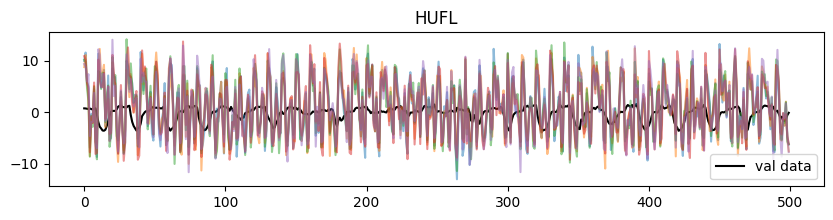

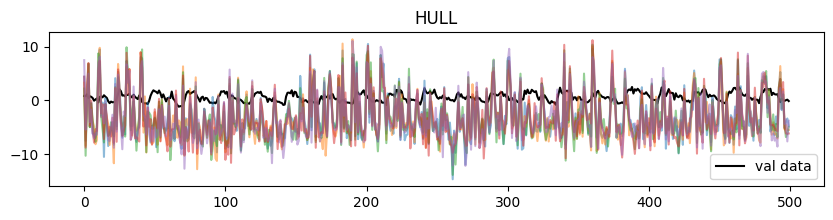

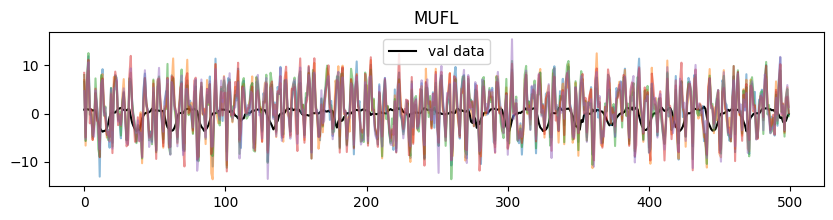

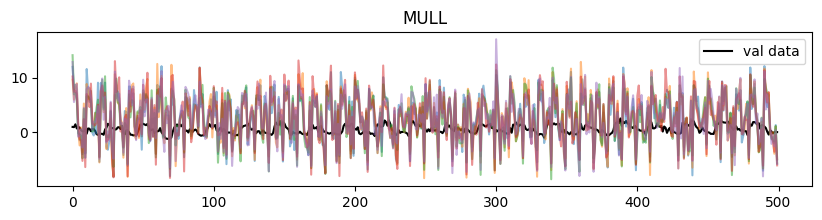

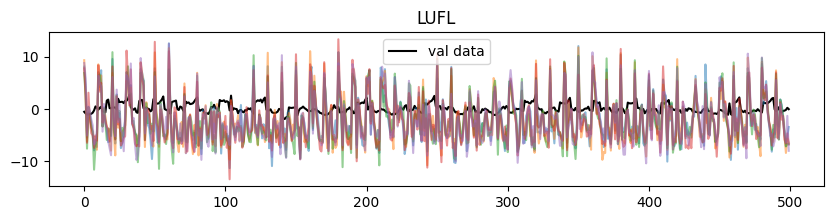

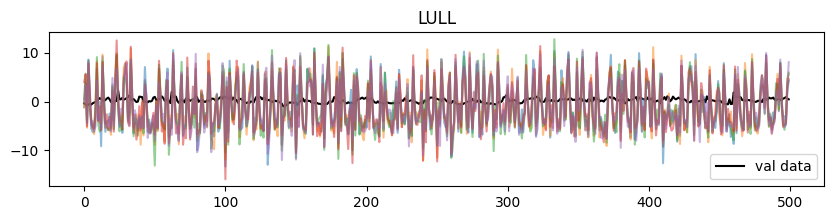

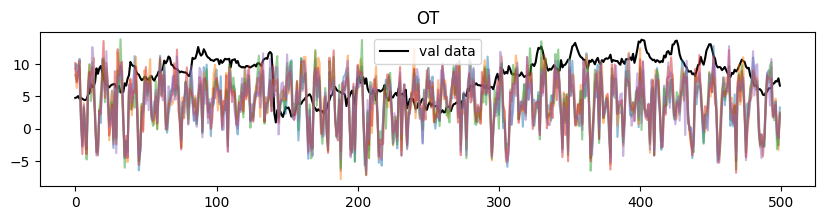

In [ ]:
fakes = gen_2.sample(test_data, n_samples=5)
for col in df.columns:
    plt.figure(figsize=(10, 2))
    plt.plot(test_data[col].values[:500], label='val data', c='black')
    for fake_data in fakes:
        plt.plot(fake_data[col].values[:500], alpha=0.5)
    plt.legend()
    plt.title(col)
    plt.show()

In [ ]:
gen_3 = TransformerGAN(
    target_columns=df.columns,
    conditional_columns=df2.columns,
    embedding_dim=7,
    window_size=10,
    num_disc_steps=1,
    batch_size=16,
    num_epochs=3,
    num_heads_discriminator=1,
    num_heads_generator=1,
    lr=0.001,
    verbose=True,
)
gen_3.fit(train_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type                     | Params | Mode 
----------------------------------------------------------
0 | gen  | TransformerGenerator     | 8.4 K  | train
1 | disc | TransformerDiscriminator | 7.5 K  | train
----------------------------------------------------------
15.9 K    Trainable params
0         Non-trainable params
15.9 K    Total params
0.064     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


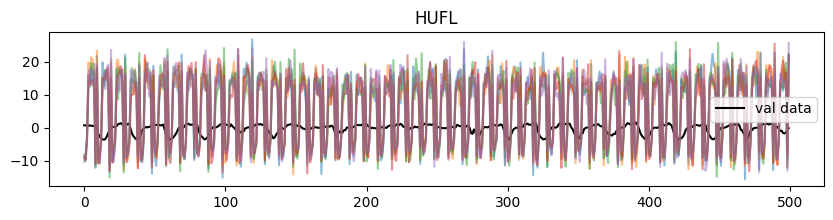

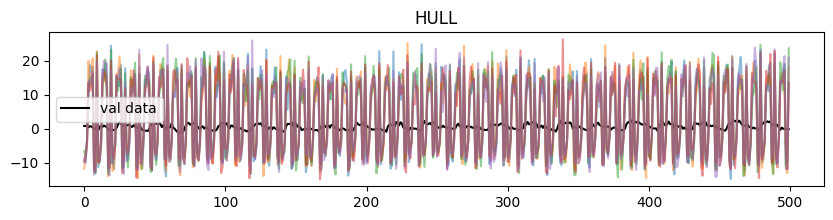

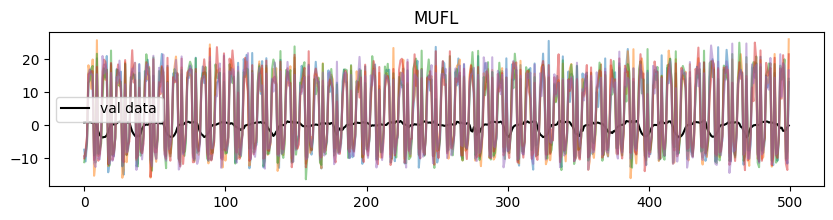

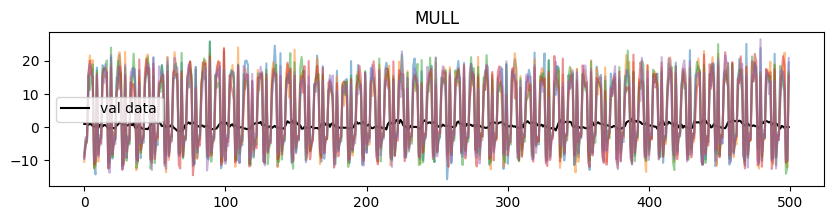

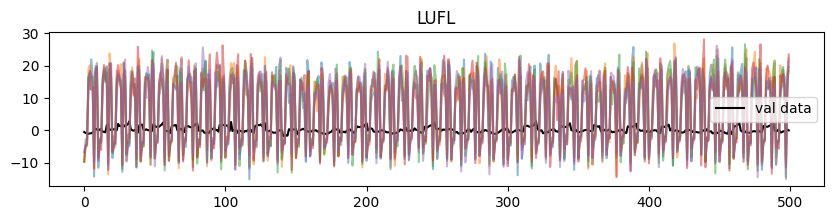

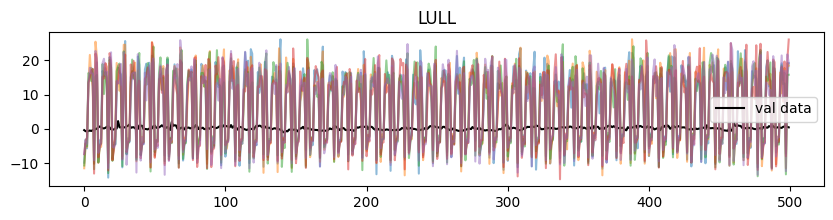

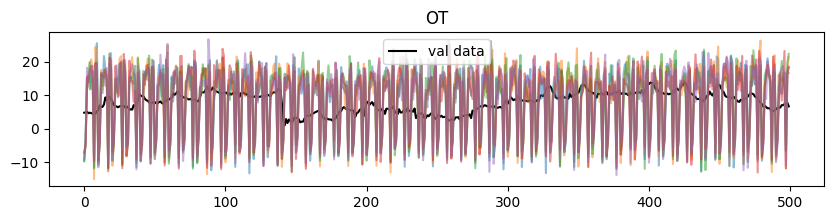

In [ ]:
fakes = gen_3.sample(test_data, n_samples=5)
for col in df.columns:
    plt.figure(figsize=(10, 2))
    plt.plot(test_data[col].values[:500], label='val data', c='black')
    for fake_data in fakes:
        plt.plot(fake_data[col].values[:500], alpha=0.5)
    plt.legend()
    plt.title(col)
    plt.show()

In [ ]:
gen_window = TransformerGAN(
    target_columns=df.columns,
    conditional_columns=df2.columns,
    embedding_dim=7,
    window_size=100,
    num_disc_steps=1,
    batch_size=16,
    num_epochs=3,
    num_heads_discriminator=1,
    num_heads_generator=1,
    lr=0.001,
    verbose=True,
)
gen_window.fit(train_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type                     | Params | Mode 
----------------------------------------------------------
0 | gen  | TransformerGenerator     | 79.0 K | train
1 | disc | TransformerDiscriminator | 7.5 K  | train
----------------------------------------------------------
86.5 K    Trainable params
0         Non-trainable params
86.5 K    Total params
0.346     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


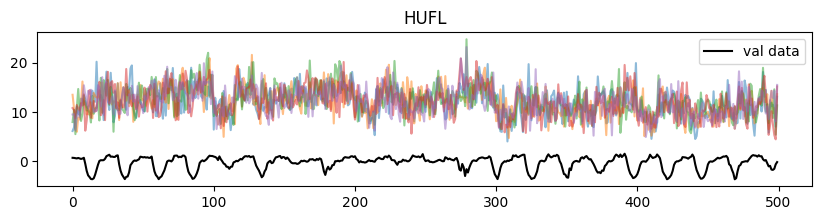

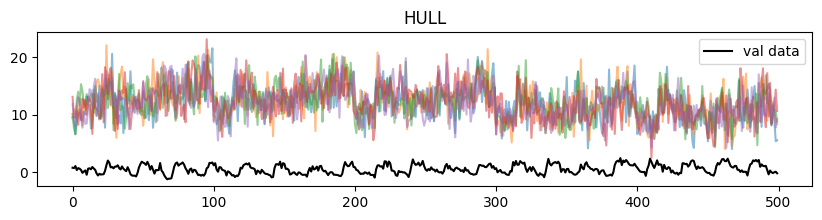

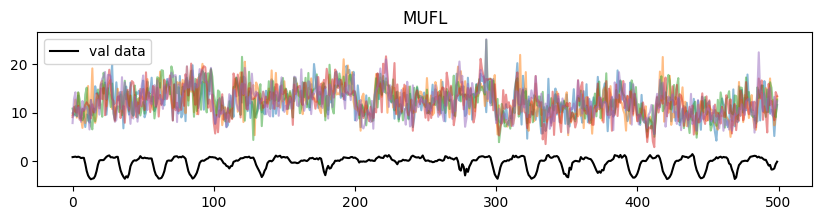

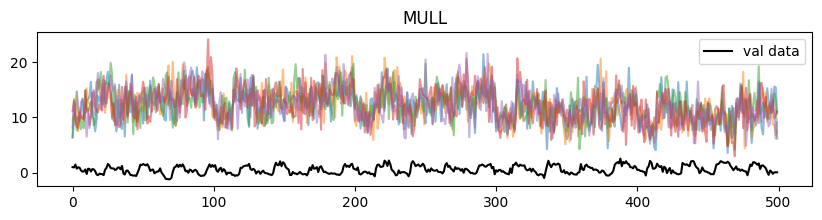

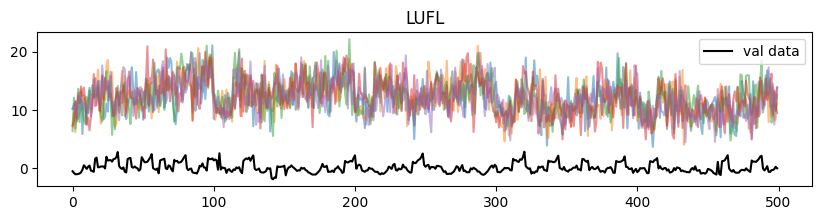

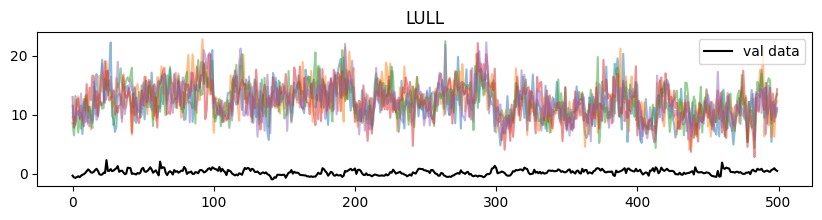

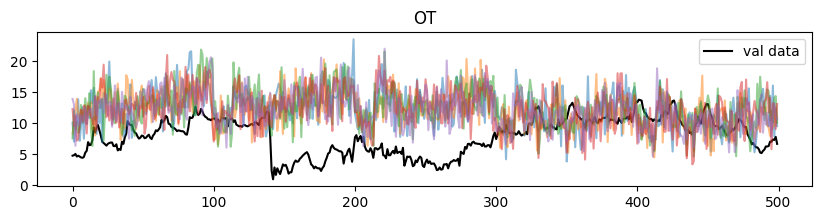

In [ ]:
fakes = gen_window.sample(test_data, n_samples=5)
for col in df.columns:
    plt.figure(figsize=(10, 2))
    plt.plot(test_data[col].values[:500], label='val data', c='black')
    for fake_data in fakes:
        plt.plot(fake_data[col].values[:500], alpha=0.5)
    plt.legend()
    plt.title(col)
    plt.show()

In [ ]:
gen_window_2 = TransformerGAN(
    target_columns=df.columns,
    conditional_columns=df2.columns,
    embedding_dim=7,
    window_size=100,
    num_disc_steps=1,
    batch_size=16,
    num_epochs=2,
    num_heads_discriminator=1,
    num_heads_generator=1,
    lr=0.001,
    verbose=True,
)
gen_window_2.fit(train_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type                     | Params | Mode 
----------------------------------------------------------
0 | gen  | TransformerGenerator     | 79.0 K | train
1 | disc | TransformerDiscriminator | 7.5 K  | train
----------------------------------------------------------
86.5 K    Trainable params
0         Non-trainable params
86.5 K    Total params
0.346     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=2` reached.


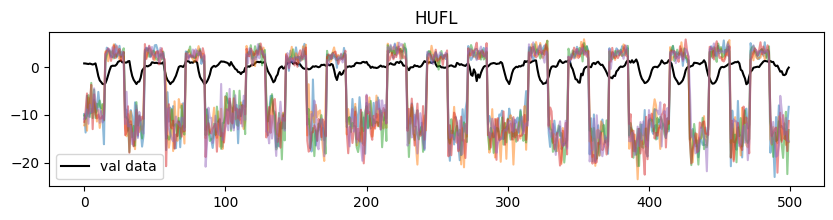

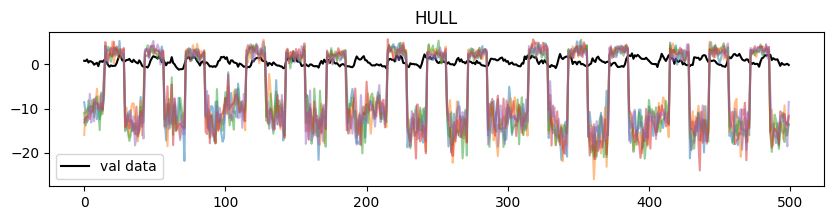

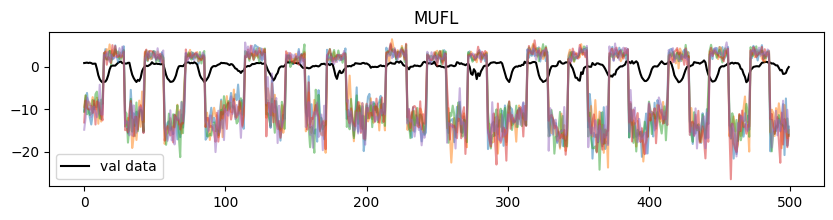

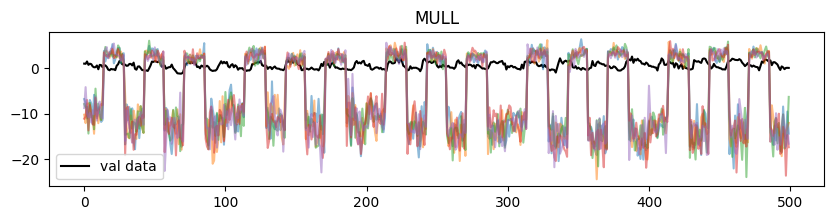

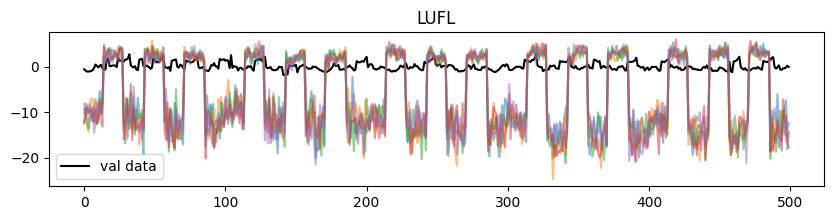

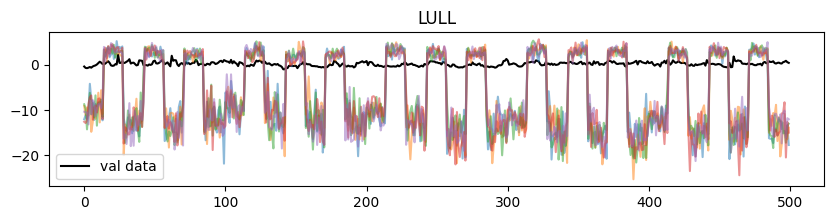

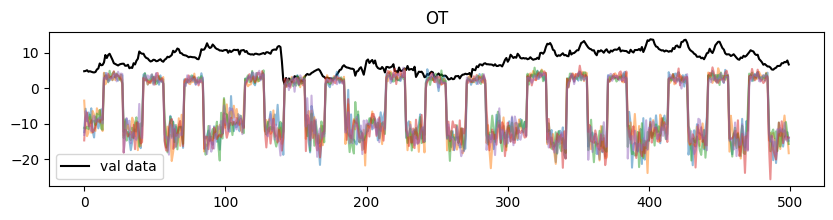

In [ ]:
fakes = gen_window_2.sample(test_data, n_samples=5)
for col in df.columns:
    plt.figure(figsize=(10, 2))
    plt.plot(test_data[col].values[:500], label='val data', c='black')
    for fake_data in fakes:
        plt.plot(fake_data[col].values[:500], alpha=0.5)
    plt.legend()
    plt.title(col)
    plt.show()

In [ ]:
gen_window_1 = TransformerGAN(
    target_columns=df.columns,
    conditional_columns=df2.columns,
    embedding_dim=7,
    window_size=100,
    num_disc_steps=1,
    batch_size=16,
    num_epochs=1,
    num_heads_discriminator=1,
    num_heads_generator=1,
    lr=0.001,
    verbose=True,
)
gen_window_1.fit(train_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type                     | Params | Mode 
----------------------------------------------------------
0 | gen  | TransformerGenerator     | 79.0 K | train
1 | disc | TransformerDiscriminator | 7.5 K  | train
----------------------------------------------------------
86.5 K    Trainable params
0         Non-trainable params
86.5 K    Total params
0.346     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=1` reached.


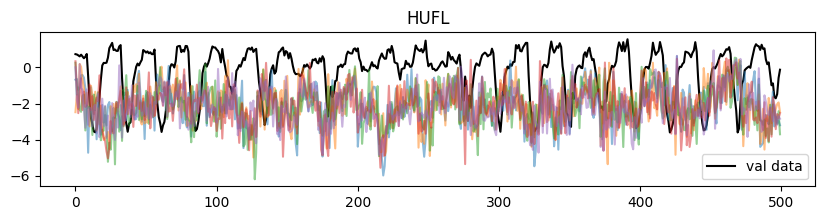

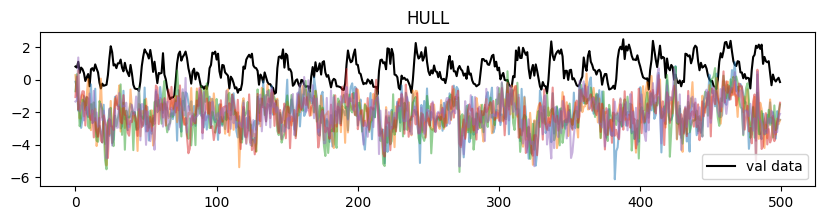

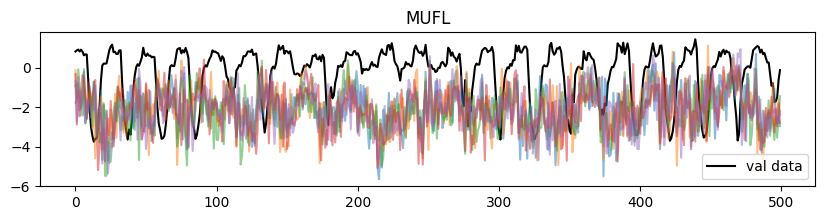

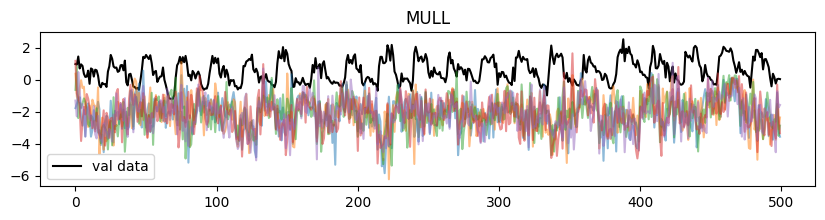

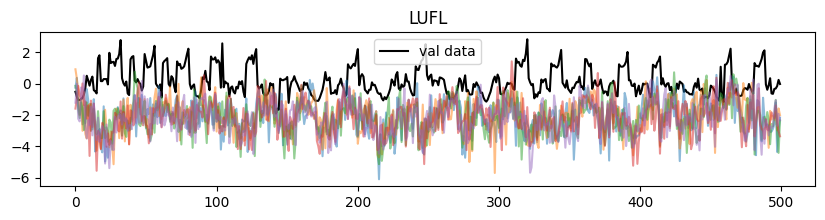

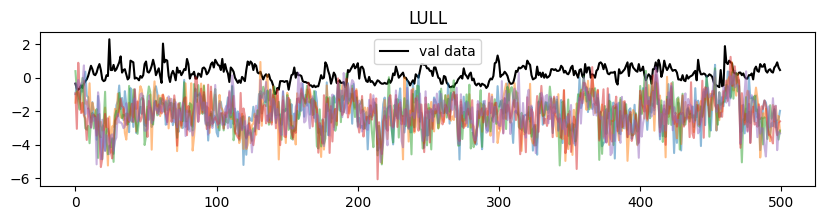

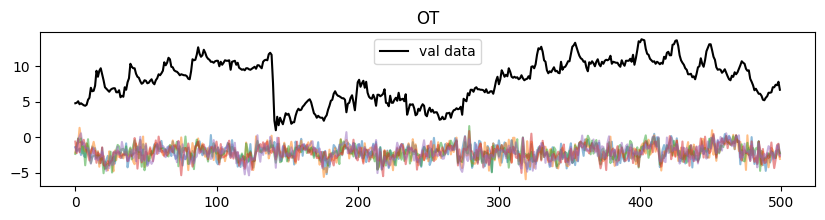

In [ ]:
fakes = gen_window_1.sample(test_data, n_samples=5)
for col in df.columns:
    plt.figure(figsize=(10, 2))
    plt.plot(test_data[col].values[:500], label='val data', c='black')
    for fake_data in fakes:
        plt.plot(fake_data[col].values[:500], alpha=0.5)
    plt.legend()
    plt.title(col)
    plt.show()

In [ ]:
gen_disc_step = TransformerGAN(
    target_columns=df.columns,
    conditional_columns=df2.columns,
    embedding_dim=7,
    window_size=100,
    num_disc_steps=5,
    batch_size=16,
    num_epochs=1,
    num_heads_discriminator=1,
    num_heads_generator=1,
    lr=0.001,
    verbose=True,
)
gen_disc_step.fit(train_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type                     | Params | Mode 
----------------------------------------------------------
0 | gen  | TransformerGenerator     | 79.0 K | train
1 | disc | TransformerDiscriminator | 7.5 K  | train
----------------------------------------------------------
86.5 K    Trainable params
0         Non-trainable params
86.5 K    Total params
0.346     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=1` reached.


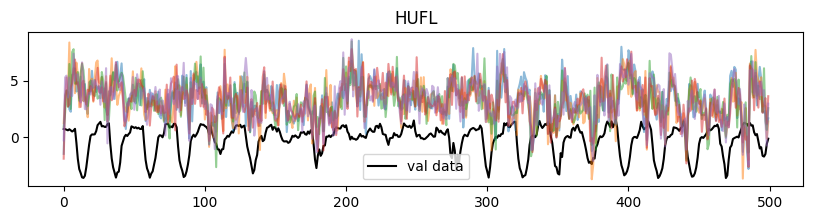

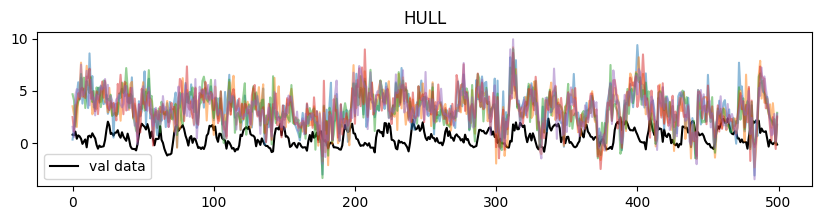

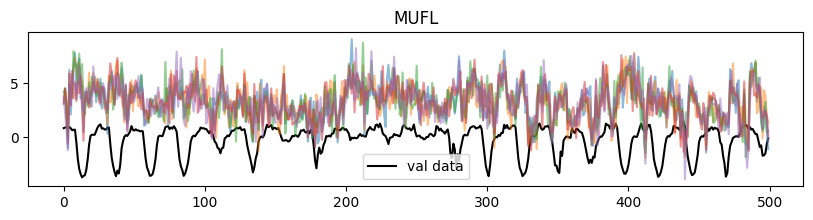

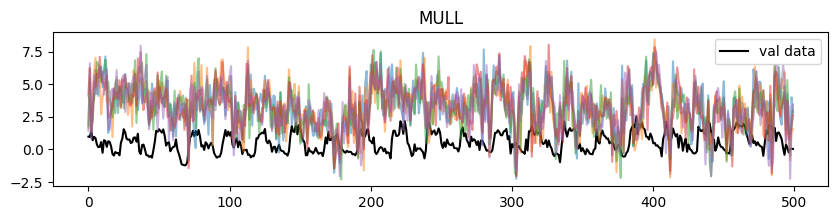

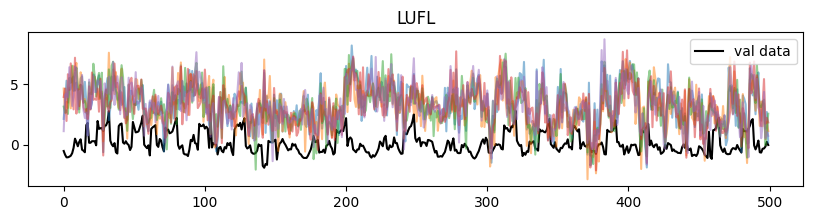

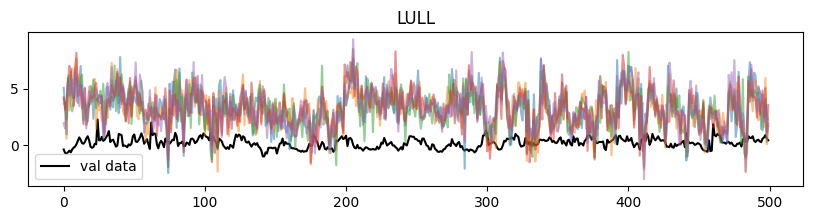

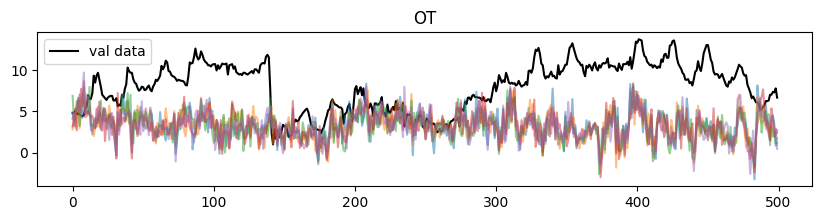

In [ ]:
fakes = gen_disc_step.sample(test_data, n_samples=5)
for col in df.columns:
    plt.figure(figsize=(10, 2))
    plt.plot(test_data[col].values[:500], label='val data', c='black')
    for fake_data in fakes:
        plt.plot(fake_data[col].values[:500], alpha=0.5)
    plt.legend()
    plt.title(col)
    plt.show()

In [ ]:
t = test_data.iloc[:10, :7].values
t

array([[ 0.73814338,  0.80437286,  0.81718743,  0.98573473, -0.51444923,
        -0.36183425,  4.78399992],
       [ 0.71918349,  0.73876001,  0.87446196,  0.94649184, -0.82789587,
        -0.667071  ,  4.85400009],
       [ 0.67178369,  1.09963053,  0.91606273,  1.45720297, -1.03743277,
        -0.71877775,  5.06500006],
       [ 0.61490387,  0.41069596,  0.81718743,  0.711034  , -1.03743277,
        -0.61703219,  4.64300013],
       [ 0.70970347,  0.73876001,  0.91078935,  0.96638969, -0.98504854,
        -0.46357982,  4.78399992],
       [ 0.61490387,  0.64034078,  0.8067872 ,  0.86800581, -0.90690161,
        -0.61703219,  4.64300013],
       [ 0.51076581,  0.41069596,  0.6245638 ,  0.37719246, -0.69736471,
        -0.36183425,  4.50199986],
       [ 0.59608553, -0.08140027,  0.67143796,  0.18042489, -0.252528  ,
        -0.21004982,  4.43200016],
       [ 0.74762339,  0.14824466,  0.66616457,  0.20032274,  0.50575515,
        -0.10830425,  4.57299995],
       [-0.48434687,  0.3450

# Upload Data for prediction

In [5]:
data1 = pd.read_csv("/content/ETDataset/ETT-small/ETTh1.csv")
data1['date'] = pd.to_datetime(data1['date'])
data1.head()

,date,HUFL,HULL,MUFL,MULL,LUFL,LULL,OT
0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000
1,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001
2,2016-07-01 02:00:00,5.157,1.741,1.279,0.355,3.777,1.218,27.787001
3,2016-07-01 03:00:00,5.090,1.942,1.279,0.391,3.807,1.279,25.044001
4,2016-07-01 04:00:00,5.358,1.942,1.492,0.462,3.868,1.279,21.948000


In [6]:

scaler = StandardScaler()
data1_scaled = scaler.fit_transform(X=data1.drop(['date'], axis=1), y=data1['OT'])
data1_scaled = pd.DataFrame(data1_scaled, index=data1.index, columns=['HUFL', 'HULL', 'MUFL', 'MULL', 'LUFL', 'LULL', 'OT'])
data1_scaled['date'] = data1['date']
df = data1_scaled.copy()
df.index = pd.to_datetime(df.date)

In [7]:
df = data1_scaled.copy()
df.index = pd.to_datetime(df.date)
df.drop(columns=['date'], inplace=True)

In [8]:
def positional_encoding(index, freqs):
    encoding = []
    for freq in freqs:
        values = getattr(index, freq)
        num_values = max(values) + 1
        steps = [x * 2.0 * np.pi / num_values for x in values]
        encoding.append(pd.DataFrame({f'{freq}_cos': np.cos(steps), f'{freq}_sin': np.sin(steps)}, index=index))
    encoding = pd.concat(encoding, axis=1)
    return encoding


df2 = positional_encoding(df.index, ['dayofweek', 'day', 'month'])
df2.head()

,dayofweek_cos,dayofweek_sin,day_cos,day_sin,month_cos,month_sin
date,,,,,,
2016-07-01 00:00:00,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 01:00:00,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 02:00:00,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 03:00:00,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316
2016-07-01 04:00:00,-0.900969,-0.433884,0.980785,0.19509,-0.970942,-0.239316


In [9]:
df_new = pd.concat([df, df2], axis=1)

val_thresh = int(df_new.shape[0] * 0.7)
test_thresh = int(df_new.shape[0] * 0.85)

train_data = df_new.iloc[:val_thresh].copy()
val_data = df_new.iloc[val_thresh:test_thresh].copy()
test_data = df_new.iloc[test_thresh:].copy()

# Playground

In [11]:
def fakereal_pairplot(fake_data, real_data, size=500):
    random_idx = np.random.randint(len(real_data), size=size)

    _fake_plot = fake_data.iloc[random_idx].copy()
    _fake_plot['source'] = 'fake'

    _real_plot = real_data.iloc[random_idx].copy()
    _real_plot['source'] = 'real'

    concated = pd.concat([_fake_plot, _real_plot])

    sns.pairplot(
        concated,
        hue='source',
        corner=True,
        plot_kws={'edgecolor': 'none', 'alpha': 0.3, 's': 10},
    )

In [14]:
from transformer_gan import TransformerGAN


gen_pg = TransformerGAN(
    target_columns=df.columns,
    conditional_columns=df2.columns,
    embedding_dim=7,
    window_size=100,
    num_disc_steps=1,
    num_heads_generator=4,
    num_heads_discriminator=4,
    transformer_dim=32,
    discriminator_depth=5,
    generator_depth=15,
    batch_size=64,
    num_epochs=40,
    lr=0.001,
    verbose=True,
)
gen_pg.fit(train_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name | Type                     | Params | Mode 
----------------------------------------------------------
0 | gen  | TransformerGenerator     | 199 K  | train
1 | disc | TransformerDiscriminator | 43.3 K | train
----------------------------------------------------------
242 K     Trainable params
0         Non-trainable params
242 K     Total params
0.971     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=40` reached.


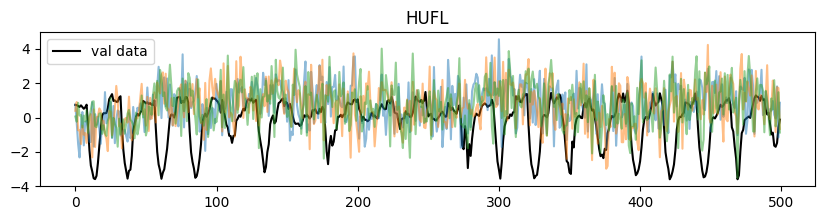

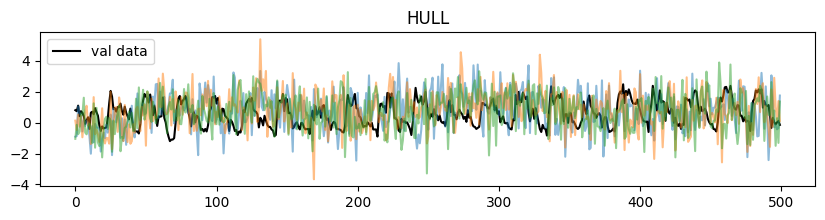

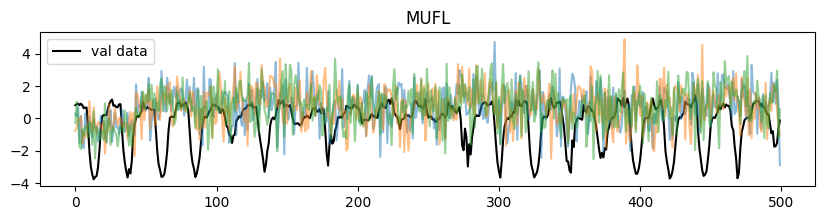

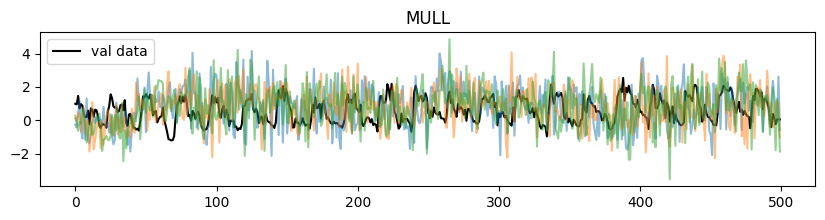

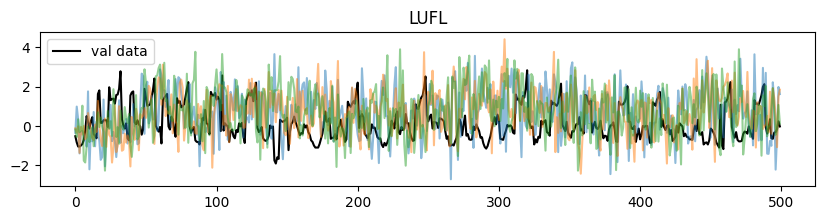

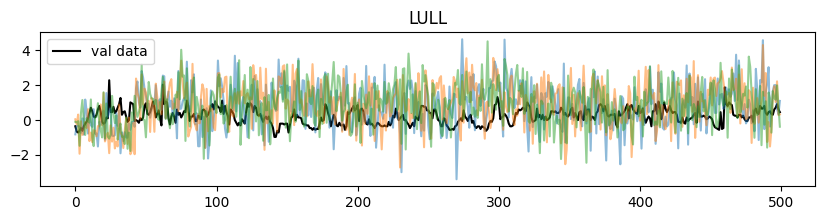

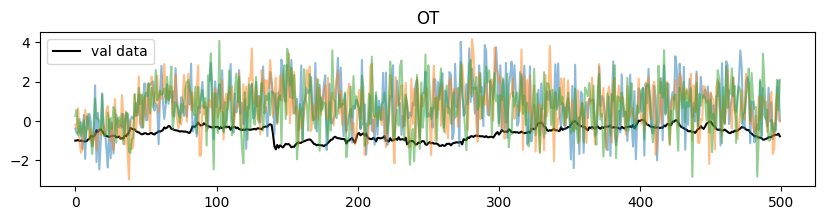

In [15]:
fakes = gen_pg.sample(test_data, n_samples=3)
for col in df.columns:
    plt.figure(figsize=(10, 2))
    plt.plot(test_data[col].values[:500], label='val data', c='black')
    for fake_data in fakes:
        plt.plot(fake_data[col].values[:500], alpha=0.5)
    plt.legend()
    plt.title(col)
    plt.show()

In [16]:
import pandas as pd
import numpy as np
from math import sqrt


def correlation_score(fake_data: pd.DataFrame, real_data: pd.DataFrame):
    assert real_data.shape == fake_data.shape

    T, n_features = real_data.shape
    fake_cov = np.zeros((n_features, n_features))
    real_cov = np.zeros((n_features, n_features))

    for i in range(n_features):
        for j in range(n_features):
            fake_cov[i, j] = (fake_data[:, i] * fake_data[:, i]).sum() / T - (fake_data[:, i].sum() / T) * (fake_data[:, j].sum() / T)
            real_cov[i, j] = (real_data[:, i] * real_data[:, i]).sum() / T - (real_data[:, i].sum() / T) * (real_data[:, j].sum() / T)

    metric = 0
    for i in range(n_features):
        for j in range(n_features):
            metric += abs(real_cov[i, j] / (sqrt(real_cov[i, i]) * real_cov[j, j]) - fake_cov[i, j] / (sqrt(fake_cov[i, i]) * fake_cov[j, j]))
    return metric / 10


correlation_score(fakes[0].values[:, :7], test_data.values[:, :7])

10.14380209744024

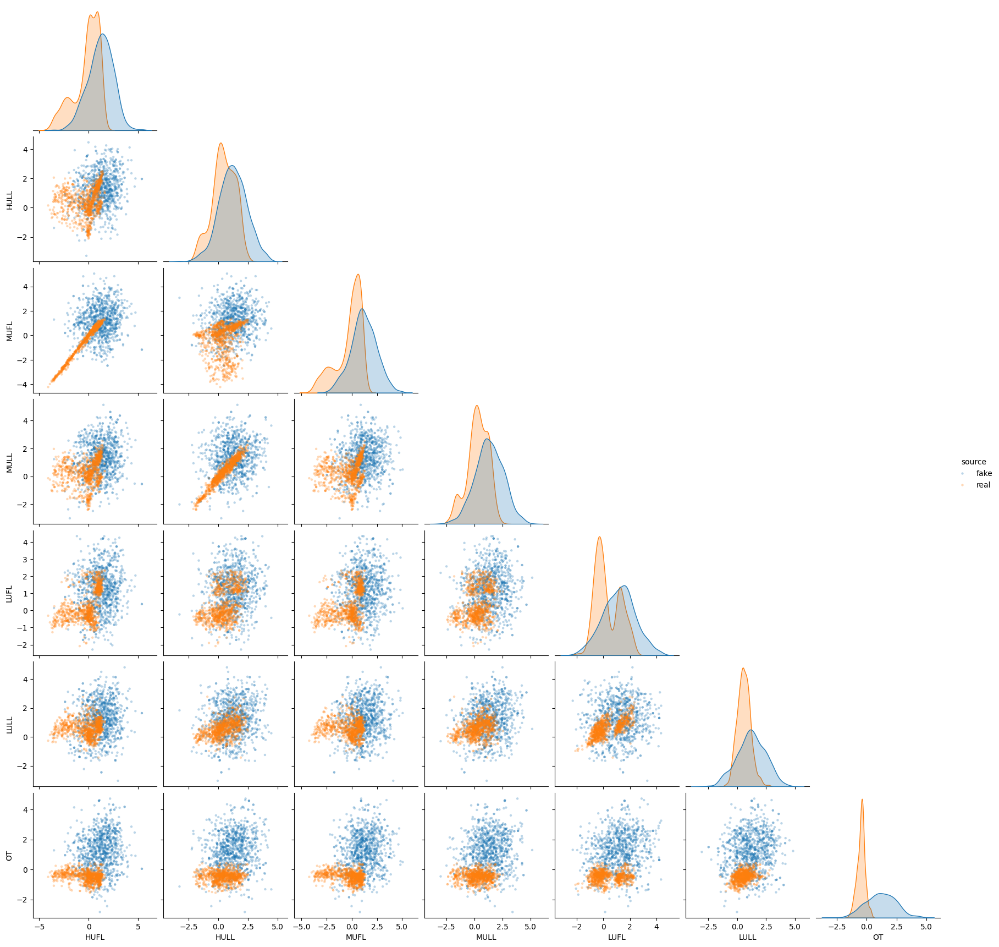

In [17]:
fakereal_pairplot(fake_data[df.columns], test_data[df.columns], size=1000)